# Convolutional Neural Networks

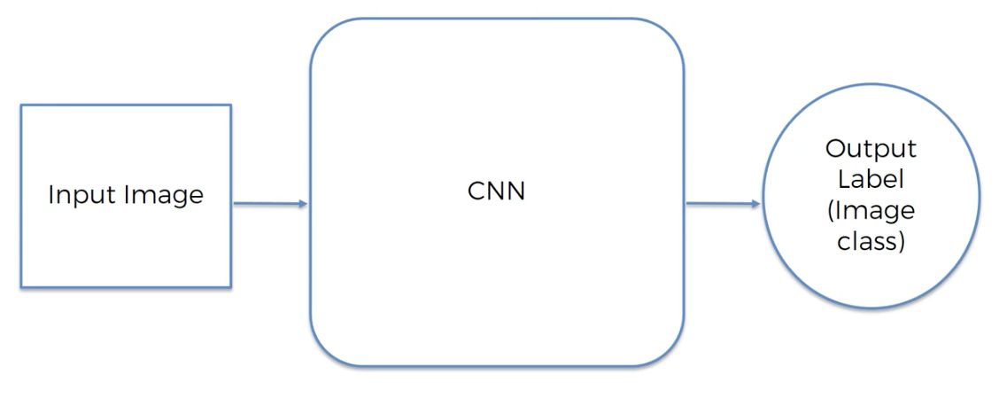
- image classification (what is the image of?)
- identify emotions (e.g. happy/sad)
- give probabilities when it's unclear of what's going on 

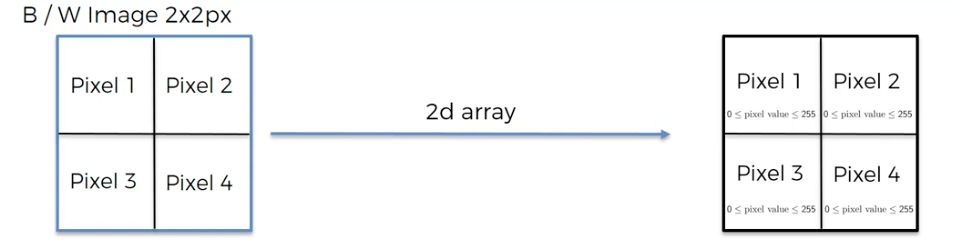
- each pixel has value between 0-255
- 2^8 = 256 (8 bits of information) gives intensity of the color
- greyscale range

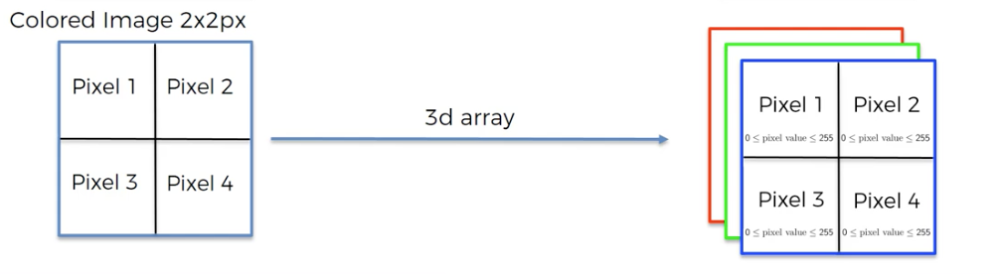
- RGB layers - red, green, blue (Each has its own intensity)
- each still has value between 0-255

Example of digital representation:
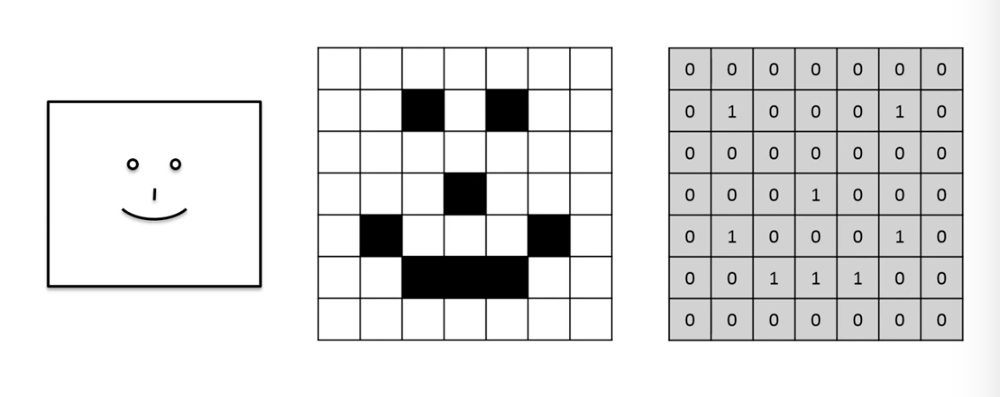

- additional reading: http://yann.lecun.com/exdb/publis/pdf/lecun-01a.pdf

## 1. Convolution
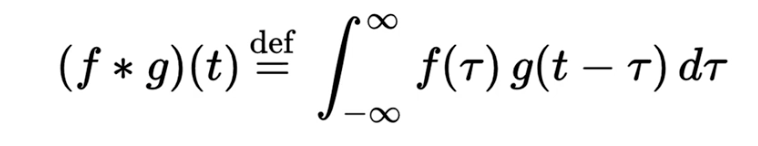
- convolution: combined integration of the two functions and shows how one function modifies shape of another function
    - additional reading: http://cs.nju.edu.cn/wujx/paper/CNN.pdf

- feature detectors are commonly 3x3 but can vary
    - can be called kernals or filters

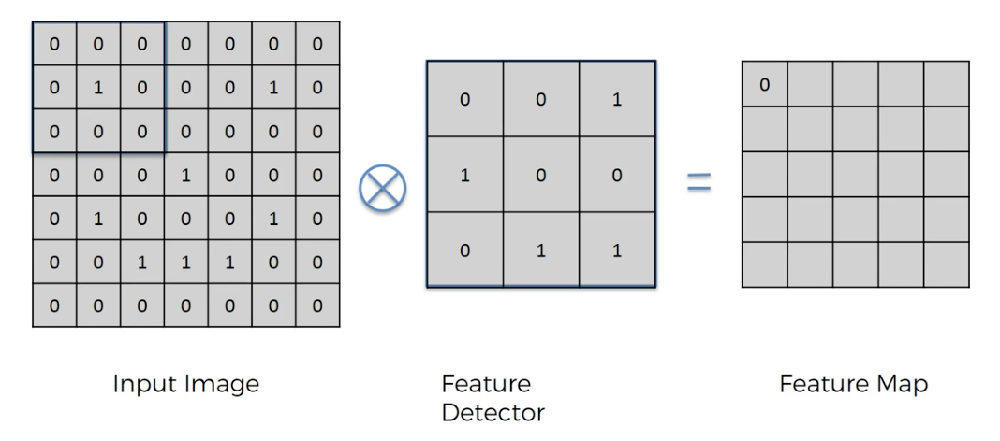
- element-wise multipliation and add everything together
- here, nothing matched, so value is 0

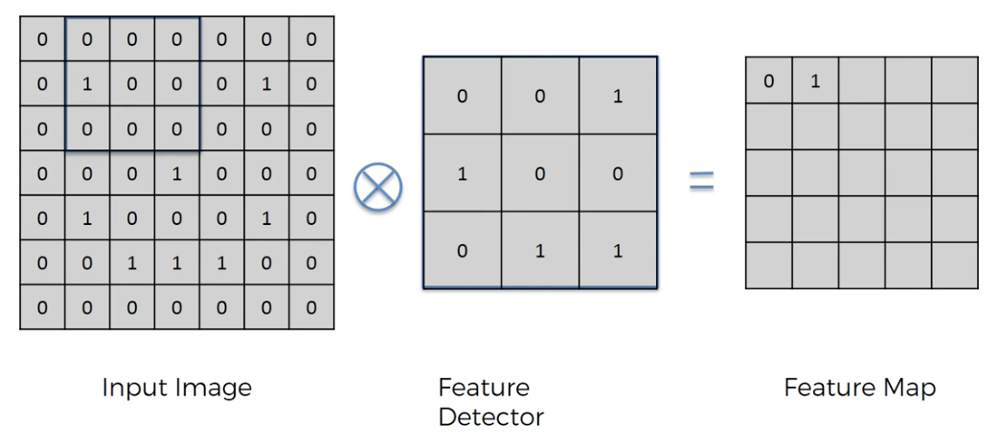
- here one of them matched up so value is 1
- keep moving to right, then down rows

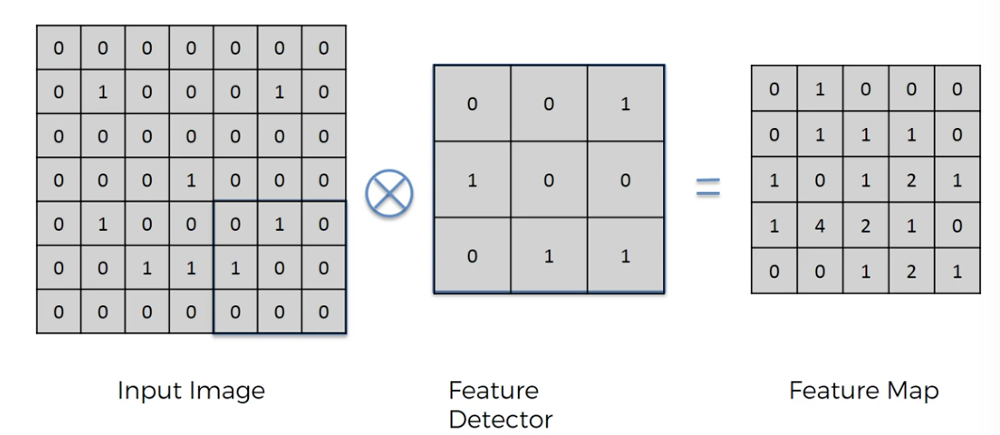
- feature map: convolved features/activation map
    - important function of feature detector: reduce size of image, but we are also losing some information
    - but detect features on certain part of image that are integral
    - when feature matches exactly - 4 becuase feature detector only has 4 1s in it
    - don't look at every single pixel, we look at features

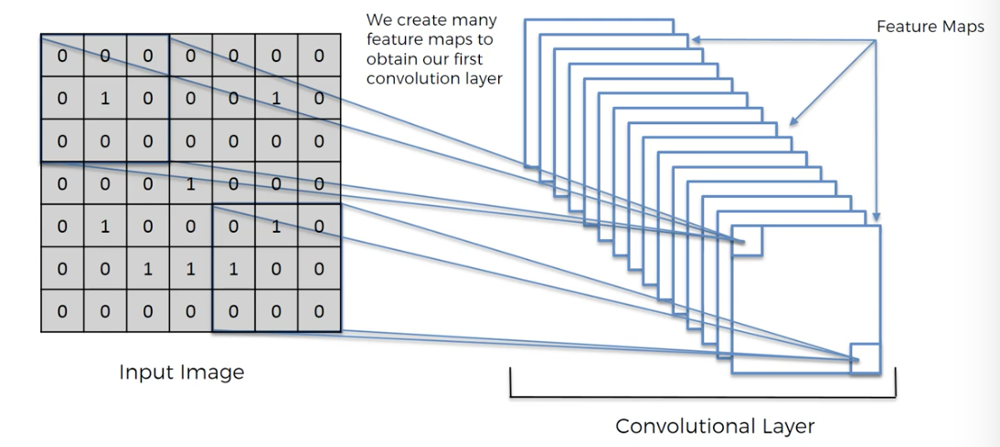
- many feature maps - each has different feature detector/filter applied

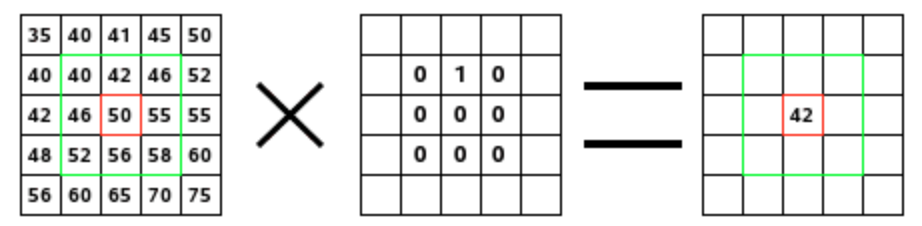

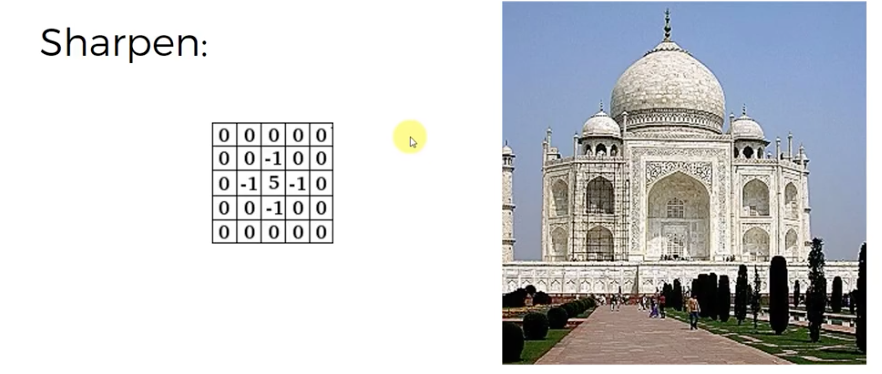
- if apply this sharpening filter, image gets sharper
- reduces pixels around it, gives importance to center

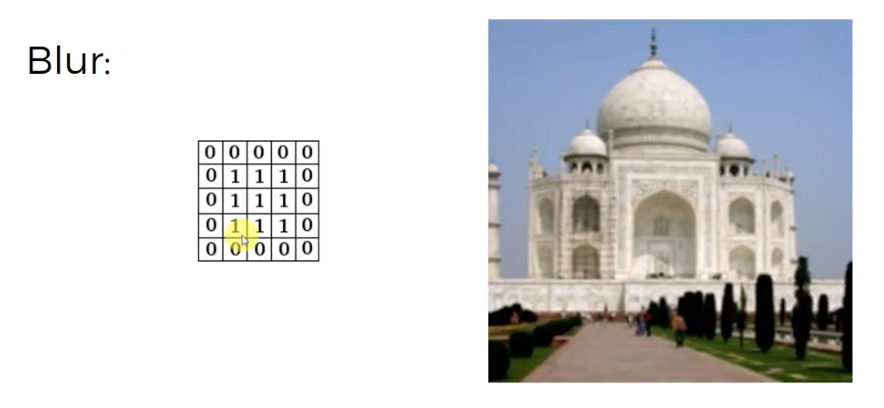
- equal significance around the 1 in the center and combine together to get a blur

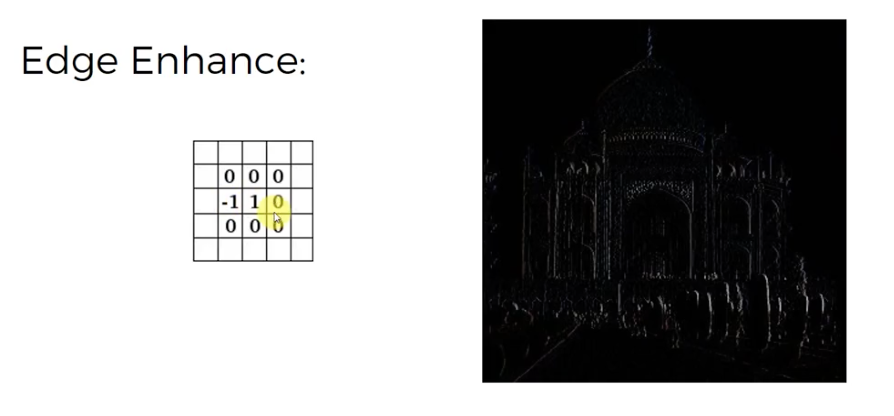

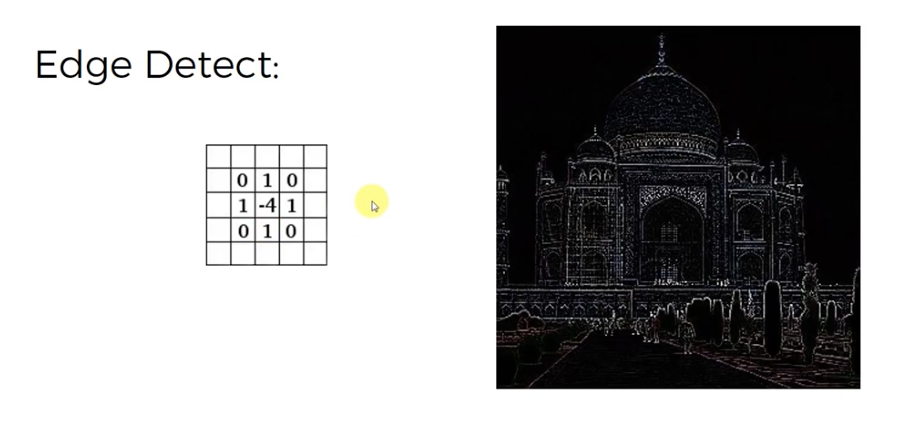

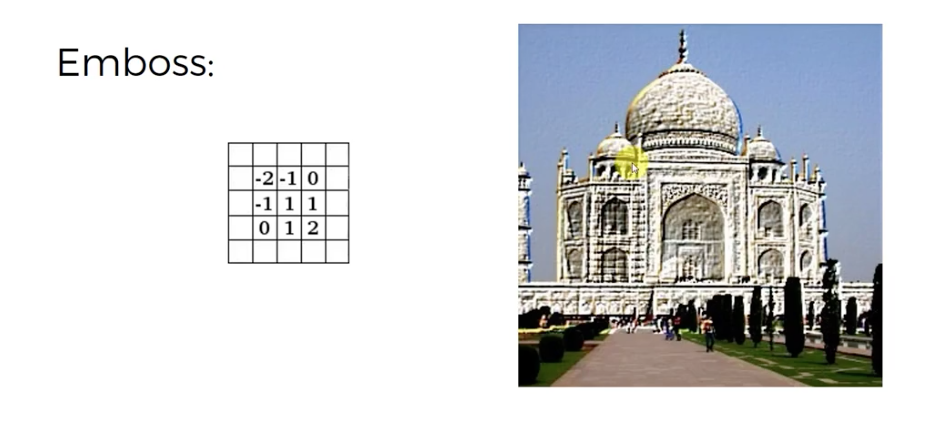

Key idea: convolution's primary purpose is to find features in your img. via feature detector + put in feature map
    - by putting in feature map, retain spatial relationship

## 2. ReLU Layer
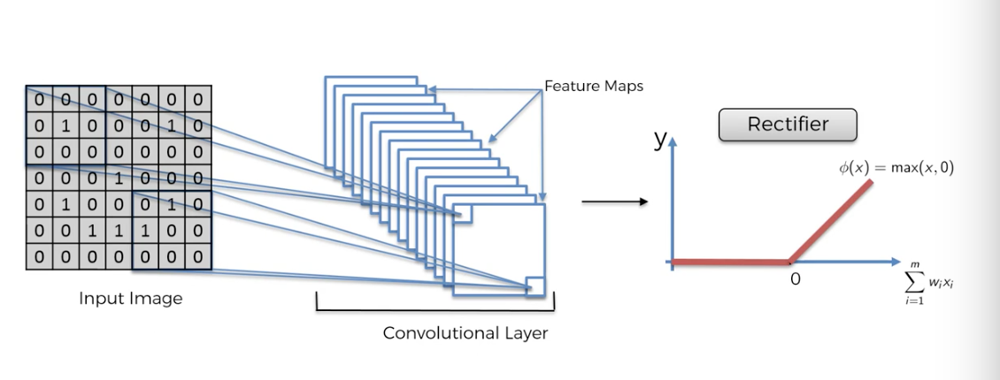
- apply rectifier to increase non-linearity in our network
- reason: images are highly non-linear
- applying convolution + running feature detection to get feature maps - risk creating something linear

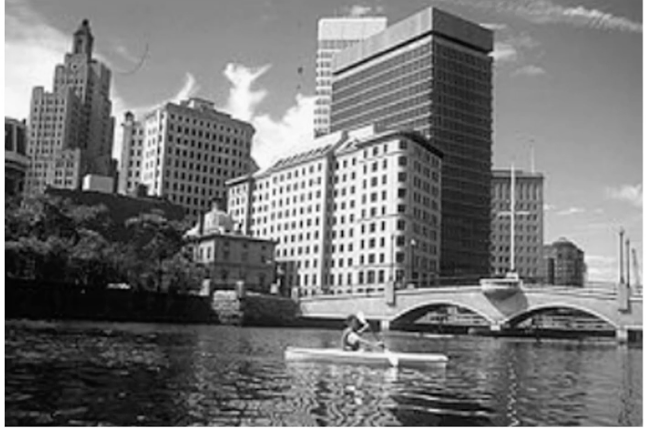

Apply feature detection:
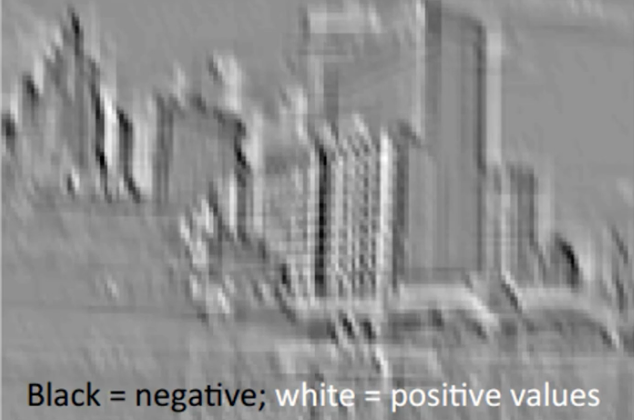

- retified linear unit function removes the black:
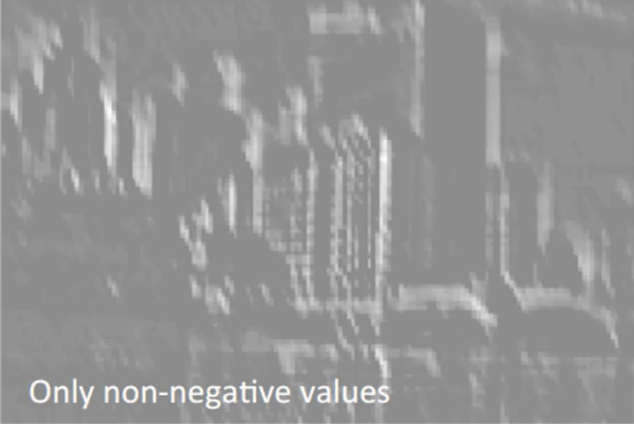
- anything below 0 turns into 0
- in terms of linearity: linear progression from light to dark; when you go white to grey, next step would be black; when you take out black you take out linearity --> abrupt change
- additional reading: https://arxiv.org/pdf/1609.04112.pdf
    - answers why a nonlinear activation function is essential at the filter output of all intermediate layers
- more reading: https://arxiv.org/pdf/1502.01852.pdf
    - different type of rectified unit (better results)

## 3. Max Pooling (downsampling)
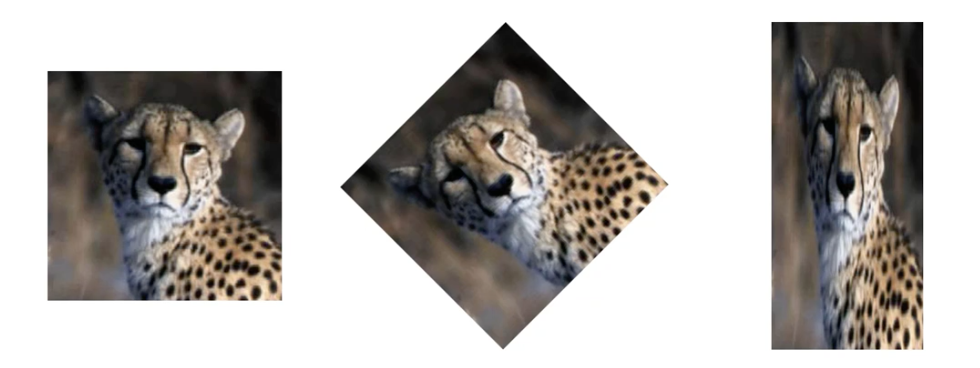
- want NN to recognize cheetah in all imgs even if theyre not positioned the same

Or...how to recognize cheetas in all these pics:
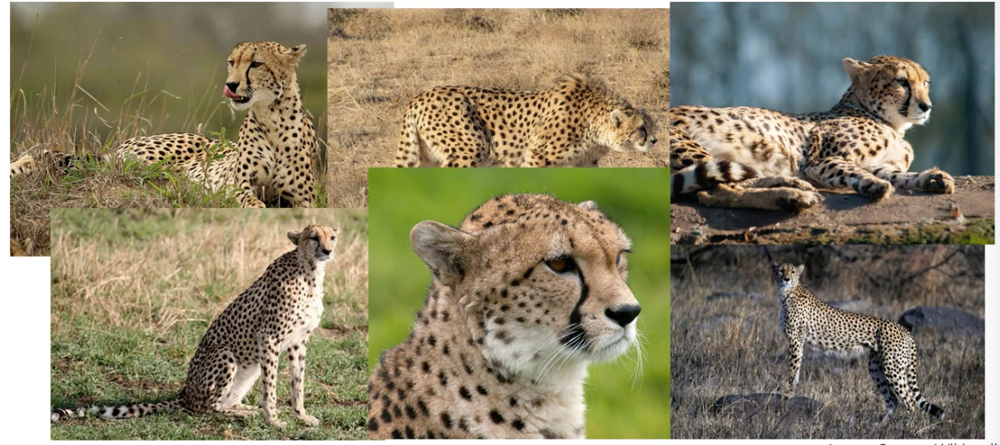

- spatial invariance: doesn't care if features are a bit tiltered or a bit different in texture/closer or further apart relative to each other aka feature itself is a bit distorted
    - need flexibility! - what pooling provides
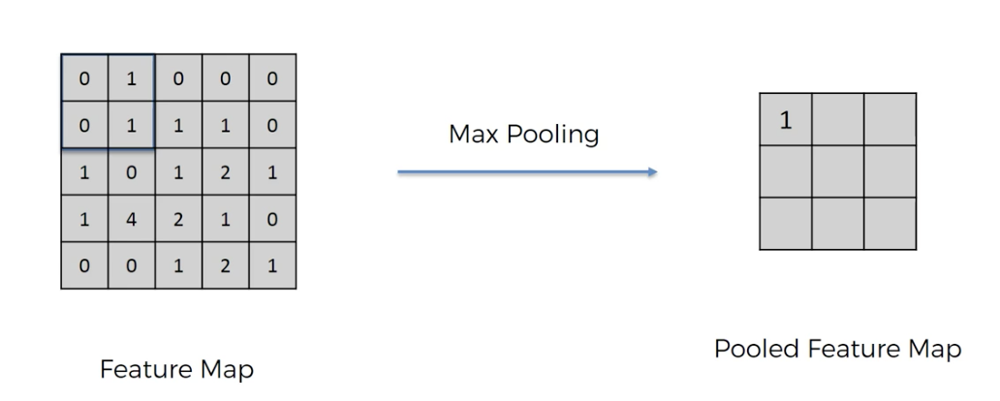
- take max value of each box
- max #s represent where you found closest similarity to a feature
- by pooling feature - get rid of 75% of info that's not important (discard 3 pixels out of 4)
- if 4 is somewhere else close by in pixel, when doing pooling, still get same pooled feature map -> helps w/ distortions
- preserve features, reduce size which helps w/ processing, smaller params reduce overfitting

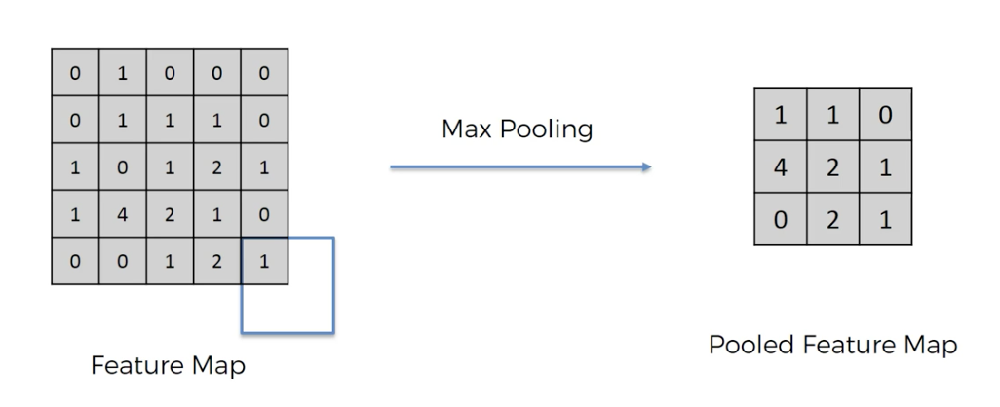

- why 'max', why 2x2 pooling?
    - http://ais.uni-bonn.de/papers/icann2010_maxpool.pdf

So far...
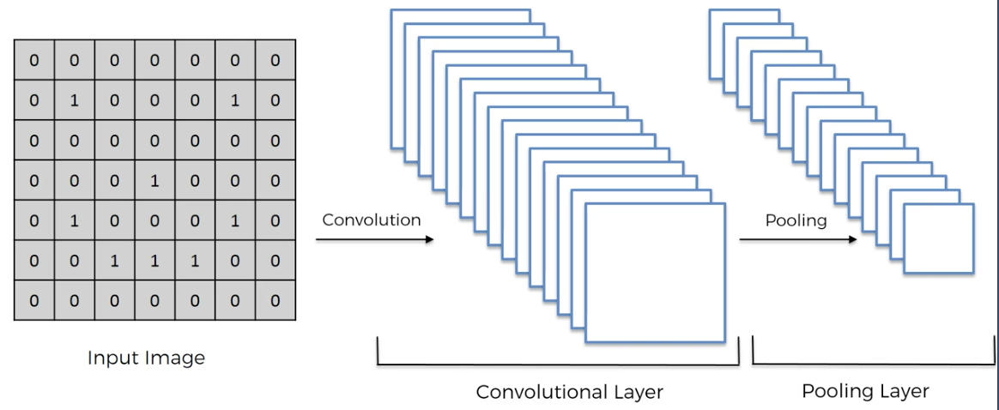

Visualization:
- http://scs.ryerson.ca/~aharley/vis/conv/flat.html

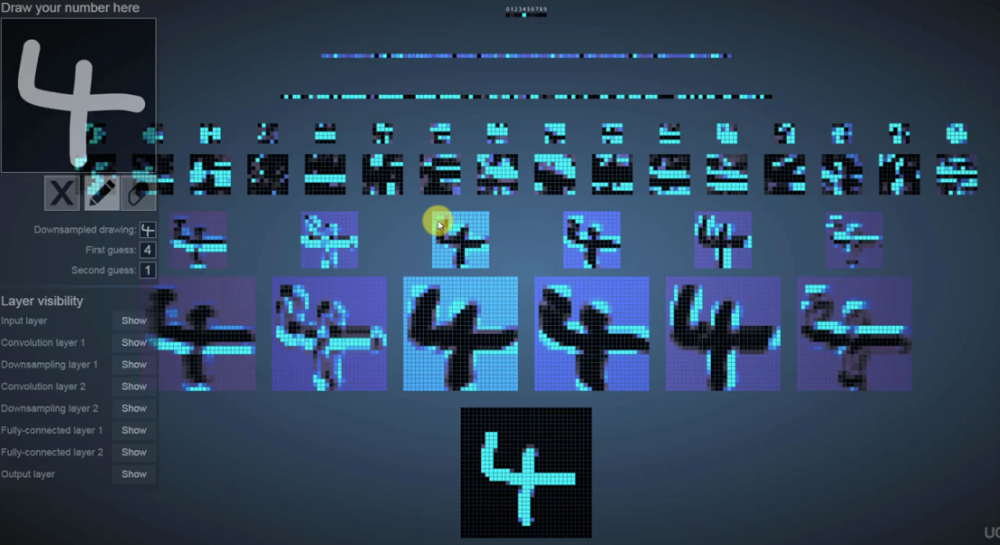

## 3. Flattening
- put matrix into column
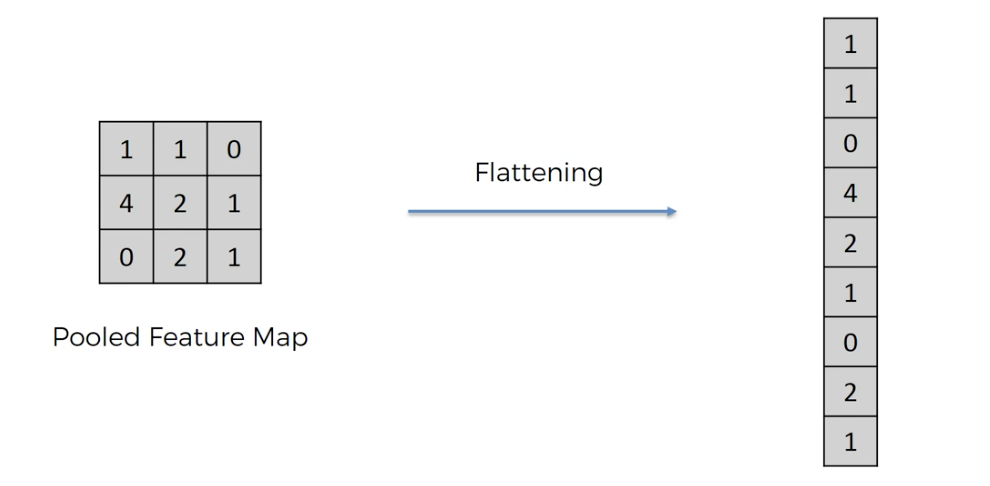

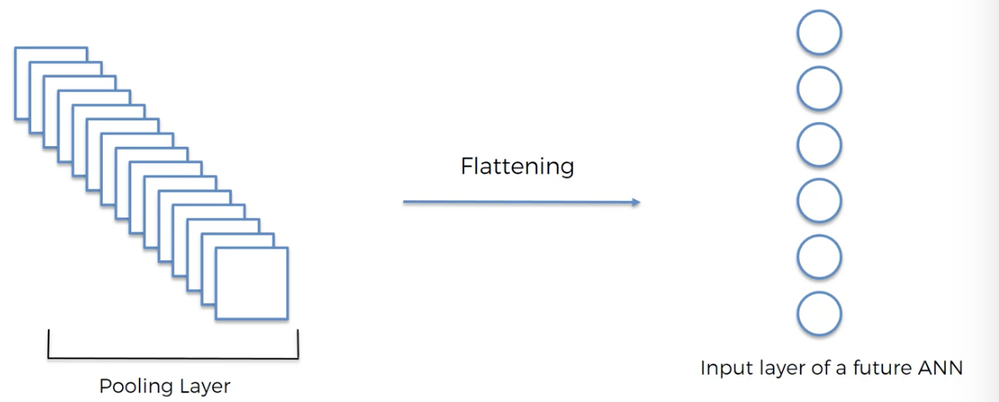

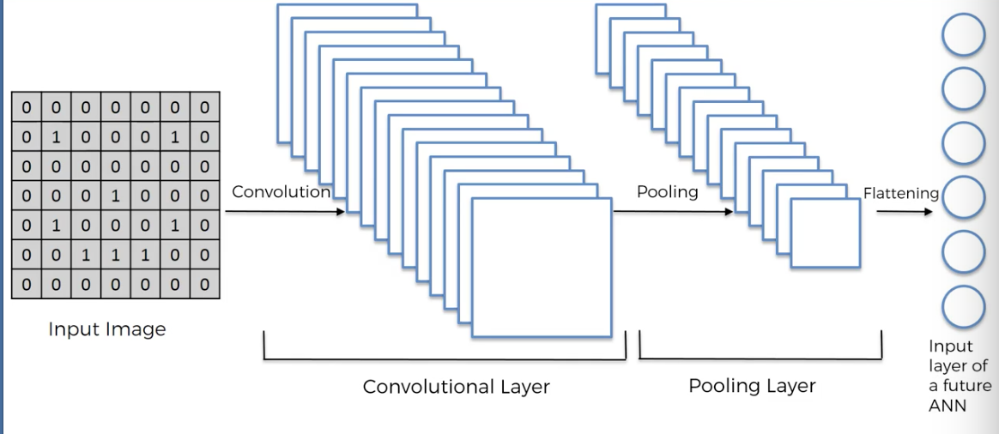
- relu after convolutional layer

## 5. Full Connection
- hidden layers in CNN - use fully connected layers
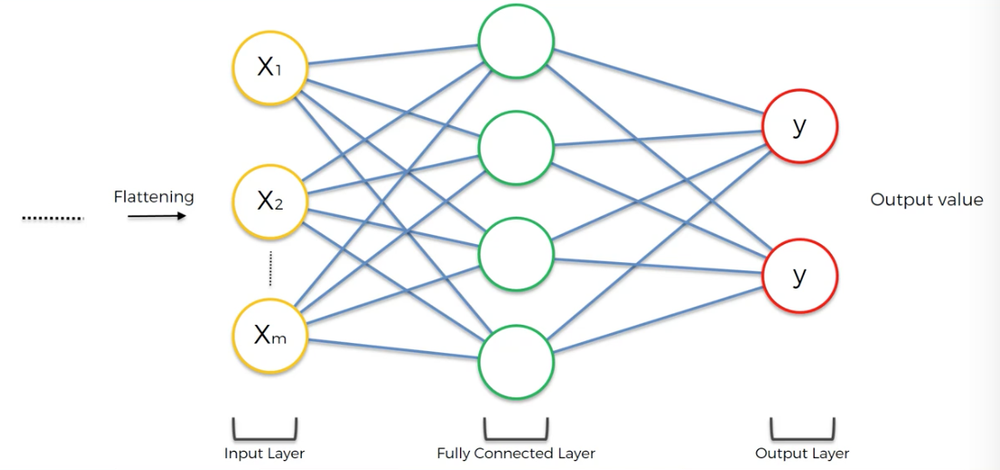
- column after flattening passed on to CNN
- combine features into more attributes that predict better

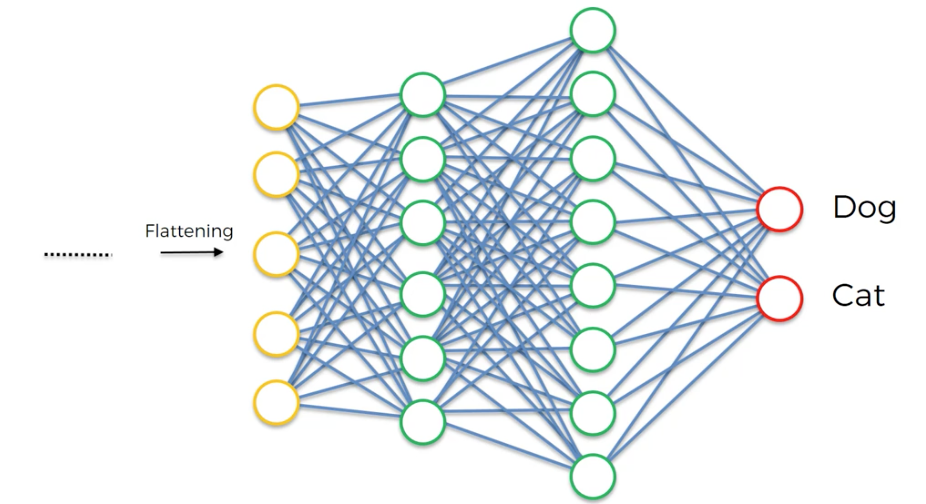
- why two outputs?
    - one output: when running regression/numerical output
    - classification - can do dog=0 and cat=1; but if more than 2 categories then have to have neuron per category
- output is like..80% dog
- loss function: cross entropy function
- optimize/minimize loss function - error calculated and backpropagated and some things are adjusted in network to help optimize
    - blue lines/synases or weights are adjusted
    - feature detectors adjusted (what if we are looking for wrong features) 
    - all done through gradient descent and back propagation

Let's look at Dog:
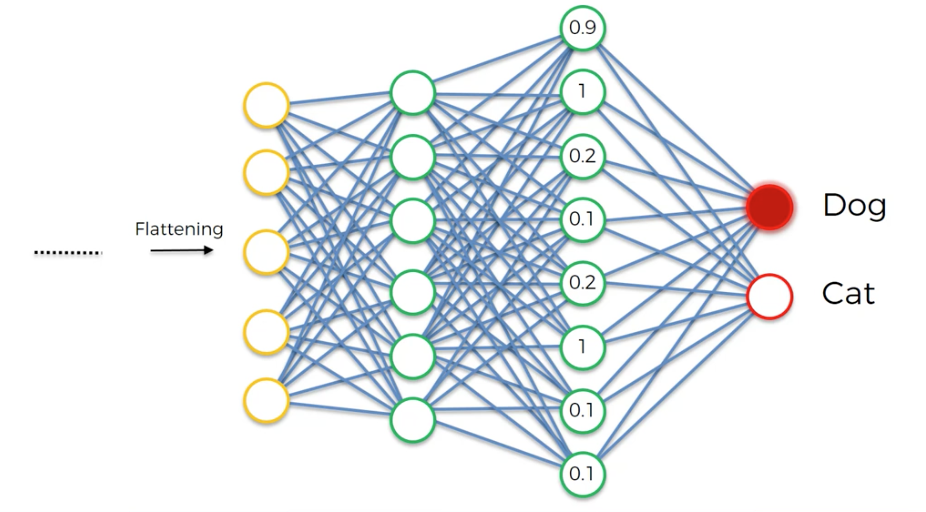
- look at previous layer:
    - 1 means that neuron was very confident that it found a certain feature (neuron firing up e.g. detecting eyebrow and communicating to dog and cat neuron)
    - 0 means that neuron didn't find the feature it was looking for

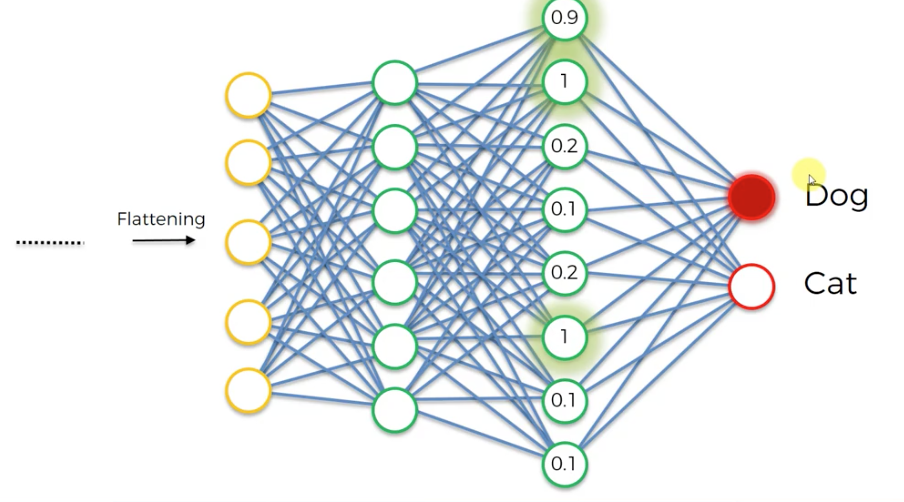
- maybe 1) nose 2) fluffy ear 3) eyebrow
- send signal to dog and cat and then decide if these signals are indicating dog and not cat
- on avg these neurons lighting up when its a dog - training thru many samples and many epochs iterations

Cats have different neurons that light up:
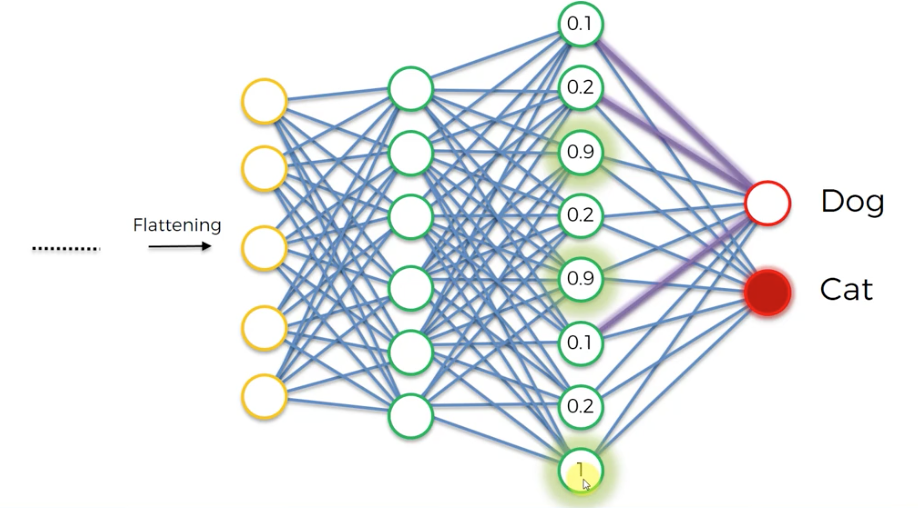

Final layer: combination of features that are indicative of dogs and cats

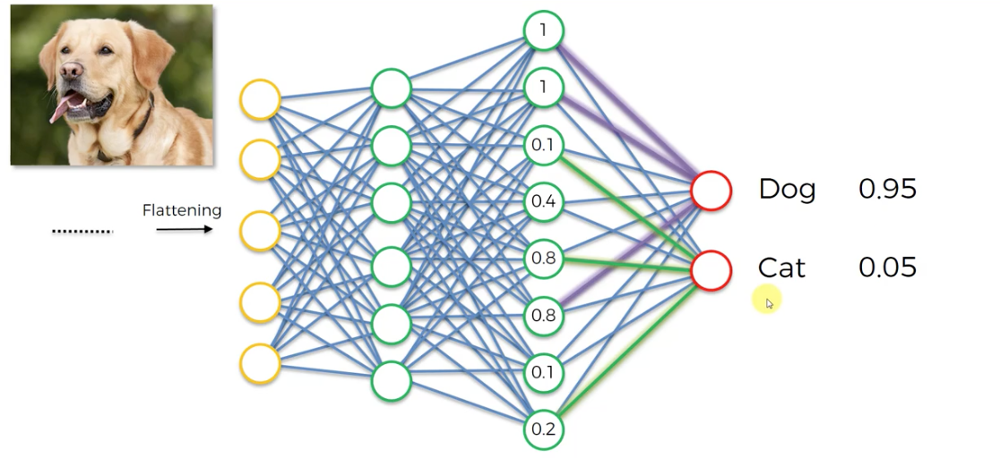

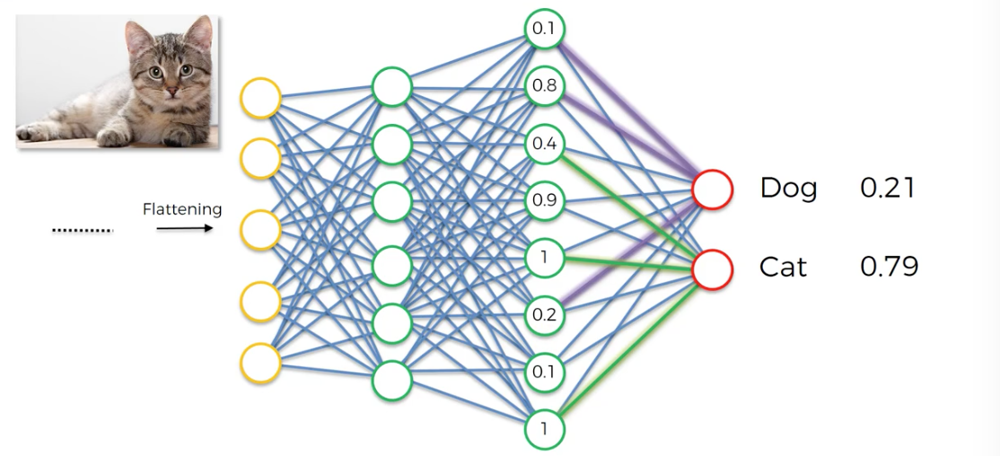

## Summary
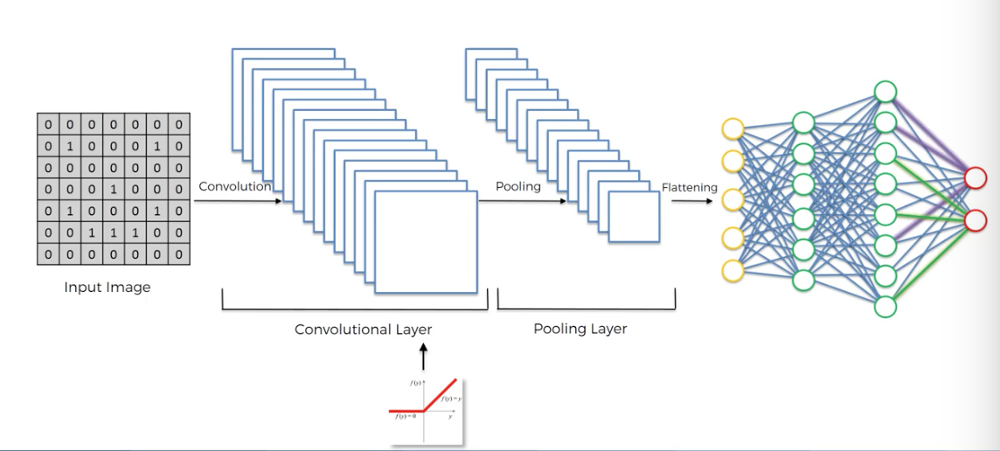

Additional readings:
- https://adeshpande3.github.io/adeshpande3.gitup.io/The-9-Deep-Learning-Papers-You-Need-To-Know-About.html

## Softmax 

- dog and cat probabilities don't necessary add up to 1
- softmax transforms these values to be between 0 and 1 and make them add up to 1
- generalization of logistics function that squashes k-dim vector of arbitrarity real values to k-dim vector of real values in range of 0 to 1 that adds up to 1
- works because of summation in denominator
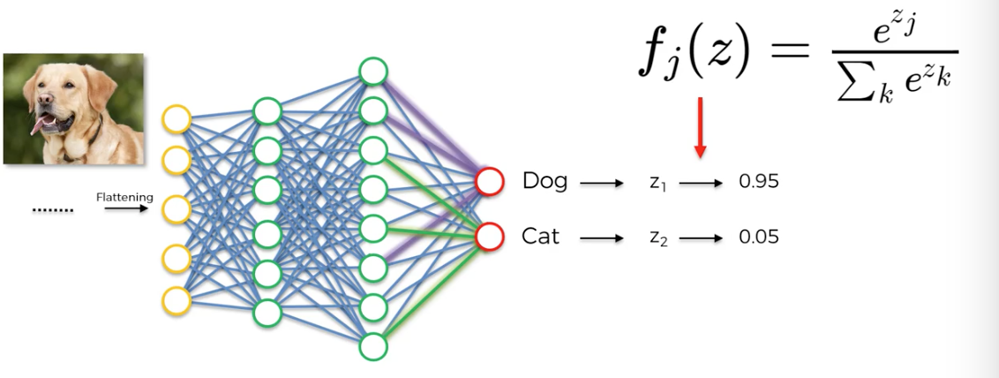

## Cross Entropy
Two representations:
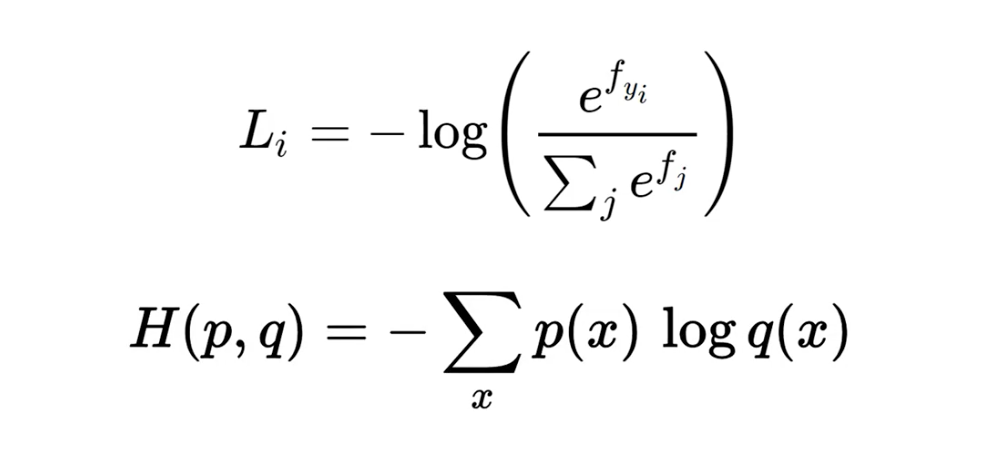
- like MSE, in CNN, after applying softmax, cross entropy is better

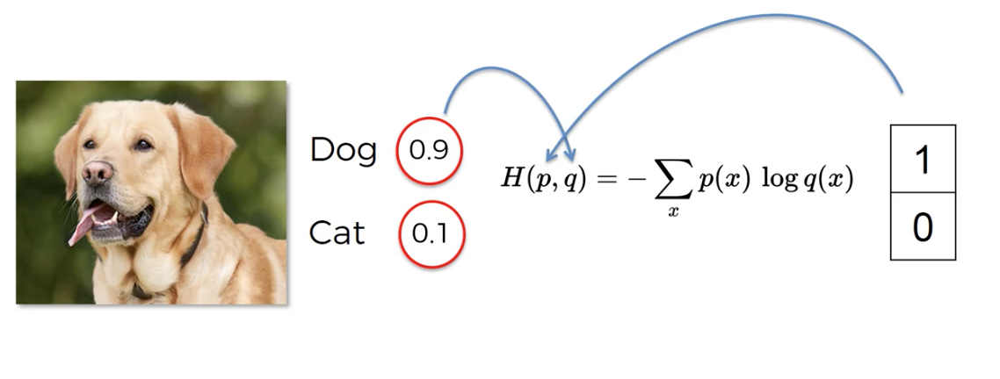

Comparing 2 models:
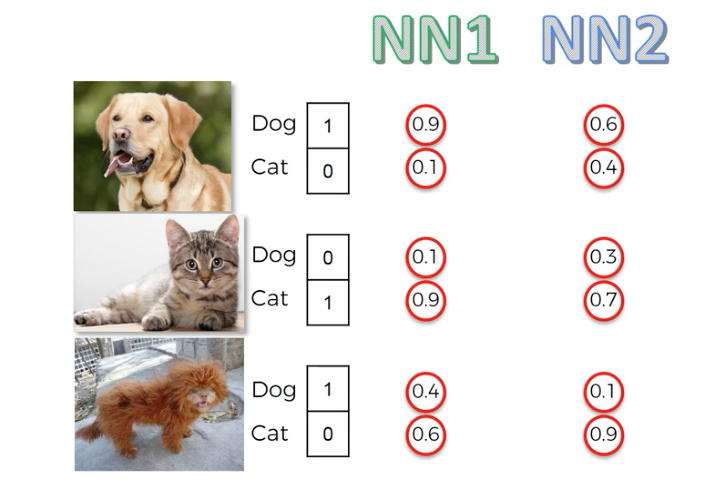

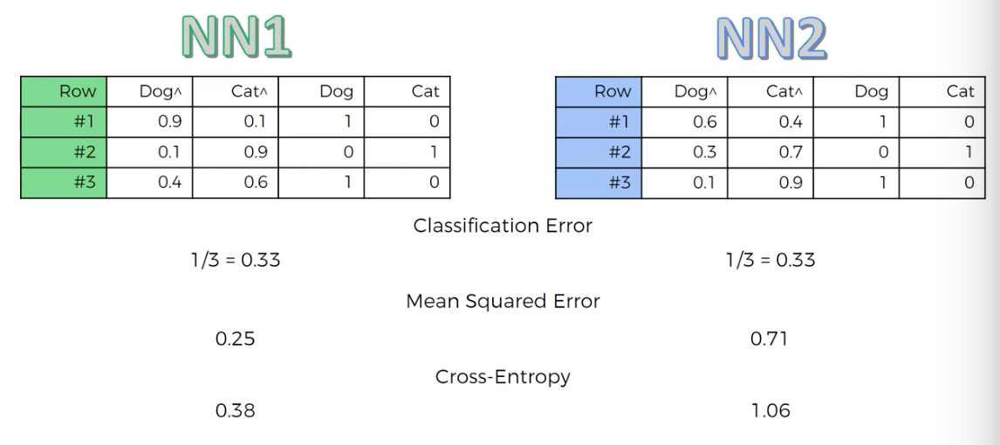
- classification error suggest both are equally powerful, but we know NN1 is actually better
- MSE (take sum of squared errors avg) - this one is more accurate as NN1 has lower error rate than NN2
- cross entropy also gives same result as MSE
    - why this over MSE? 
        - at very start of back propagation, output value is very tiny (much smaller than value that you want)
        - gradient in gradient descent will be very low - hard for NN to start doing something and move around/adjust weights and move in right direction
        - when you use logarithm in cross entropy, helps network assess even small area like that and do something about it
        - in MSE, it'll seem that .000001 to 0.0001 didn't change that much - seem insignificant and won't guide graident boosting or back propagation
        - in cross entropy will understand that even if these are small adjustments in absolute terms, in relative terms it's a huge improvement
        - help get NN to optimal state
        - preferred only for classification
        - in regression, MSE is better
        - preferred when softmax is applied
- google: 'Softmax output function' by Goeffrey Hinton
- additional reading: 
    - https://rdipietro.github.io/friendly-intro-to-cross-entropy-loss/
    - http://peterroelants.github.io/posts/neural_network_implementation_intermezzo02/

Example: folder of images of cat and dogs - classify!
- folder for test and training with subfolders cat and dogs
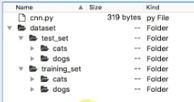

In [1]:
from keras.models import Sequential
from keras.layers import Convolution2D #convolution step
from keras.layers import MaxPooling2D #pooling step
from keras.layers import Flatten #flatten step
from keras.layers import Dense #full connection NN layers

Using TensorFlow backend.


In [2]:
# Initialising the CNN
classifier = Sequential()

Convolution step
- choose number of feature detectors to apply to img (common practice is to start with 32)
    - then build to 64, 128, 256, etc..
- 3,3 is the size of the feature detector
- expected input (dim of 2d array, dim of 2d array, number of channels)
    - this is because we're using tensorflow backend
    - if not, input (number of channels, dim, dim)
- rectifier activation function (make sure we don't have any negative values to have non-linearity in NN)

In [3]:
# Step 1 - Convolution
classifier.add(Convolution2D(32, 3, 3, input_shape = (64, 64, 3), activation = 'relu'))

/Users/Nicha/anaconda/envs/tensorflow/lib/python2.7/site-packages/ipykernel_launcher.py:2: UserWarning: Update your `Conv2D` call to the Keras 2 API: `Conv2D(32, (3, 3), activation="relu", input_shape=(64, 64, 3...)`
  


Pooling step
- pooling square size (2,2) - size of feature map reduced by 2x
    - most of the time, we take 2x2 because we don't want to lose the information - keep info and still being precise on where we have the high numbers
- reduce computational complexity

In [4]:
# Step 2 - Pooling
classifier.add(MaxPooling2D(pool_size = (2, 2)))

In [5]:
# Adding a second convolutional layer
classifier.add(Convolution2D(32, 3, 3, activation = 'relu'))
classifier.add(MaxPooling2D(pool_size = (2, 2)))

/Users/Nicha/anaconda/envs/tensorflow/lib/python2.7/site-packages/ipykernel_launcher.py:2: UserWarning: Update your `Conv2D` call to the Keras 2 API: `Conv2D(32, (3, 3), activation="relu")`
  


Why don't we lose spatial information by flattening?
- because by creating feature maps, we extracted the spatial structure info
- high numbers associated to specific feature in input image
- flatten - keep this info in one single vector
- if don't do steps prior, don't get info on cells around each pixel and will get huge vector representing each one pixel

In [6]:
# Step 3 - Flattening
classifier.add(Flatten())

Full connection
- output_dim - number of nodes in the hidden layer (no rule of thumb) - common practice is avg between # of input and output
    - 32 feature maps so many input layers
    - so just experiment with 128
    - common practice to put a power of 2
- activation function
    - relu first
    - then sigmoid cuz binary outcome w/ output_dim = 1

In [7]:
# Step 4 - Full connection
classifier.add(Dense(output_dim = 128, activation = 'relu'))
classifier.add(Dense(output_dim = 1, activation = 'sigmoid'))

/Users/Nicha/anaconda/envs/tensorflow/lib/python2.7/site-packages/ipykernel_launcher.py:2: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(units=128, activation="relu")`
  
/Users/Nicha/anaconda/envs/tensorflow/lib/python2.7/site-packages/ipykernel_launcher.py:3: UserWarning: Update your `Dense` call to the Keras 2 API: `Dense(units=1, activation="sigmoid")`
  This is separate from the ipykernel package so we can avoid doing imports until


In [8]:
# Compiling the CNN
classifier.compile(optimizer = 'adam', loss = 'binary_crossentropy', metrics = ['accuracy'])
#if more than 2 categories - need to choose categorical cross entropy

- had to pip install pillow

- image augmentation - prevent overfitting
- keras documentation: https://keras.io/
    - image processing
    - ImageDataGenerator
- if model find correlations in trainset but fail to generalize these correlations on new observations
- need more images or use trick
- create many batches of our images and each batch apply some random transformations on random selection of img e.g. rotating, flip, shift, shear to get more diverse images in training
- random transformations - never find same pic across batch

In [9]:
# Part 2 - Fitting the CNN to the images

from keras.preprocessing.image import ImageDataGenerator

train_datagen = ImageDataGenerator(rescale = 1./255,
                                   #1/255 means pixels between 0 and 1
                                   shear_range = 0.2,
                                   zoom_range = 0.2,
                                   #0.2 is param of how much you want to apply these transformations
                                   horizontal_flip = True)

test_datagen = ImageDataGenerator(rescale = 1./255)

training_set = train_datagen.flow_from_directory('dataset/training_set', #dir to extract imges from
                                                 target_size = (64, 64), #size of your imges expected in CNN model
                                                 batch_size = 32, #number of obs before which weights are adjusted
                                                 class_mode = 'binary')

test_set = test_datagen.flow_from_directory('dataset/test_set',
                                            target_size = (64, 64),
                                            batch_size = 32,
                                            class_mode = 'binary')

classifier.fit_generator(training_set,
                         samples_per_epoch = 8000,
                         nb_epoch = 25,
                         validation_data = test_set,
                         nb_val_samples = 2000)

Found 8000 images belonging to 2 classes.
Found 2000 images belonging to 2 classes.


/Users/Nicha/anaconda/envs/tensorflow/lib/python2.7/site-packages/ipykernel_launcher.py:26: UserWarning: The semantics of the Keras 2 argument `steps_per_epoch` is not the same as the Keras 1 argument `samples_per_epoch`. `steps_per_epoch` is the number of batches to draw from the generator at each epoch. Basically steps_per_epoch = samples_per_epoch/batch_size. Similarly `nb_val_samples`->`validation_steps` and `val_samples`->`steps` arguments have changed. Update your method calls accordingly.
/Users/Nicha/anaconda/envs/tensorflow/lib/python2.7/site-packages/ipykernel_launcher.py:26: UserWarning: Update your `fit_generator` call to the Keras 2 API: `fit_generator(<keras.pre..., validation_data=<keras.pre..., steps_per_epoch=250, epochs=25, validation_steps=2000)`


Epoch 1/25
250/250 [==============================] - 566s 2s/step - loss: 0.6445 - acc: 0.6230 - val_loss: 0.5918 - val_acc: 0.7135
Epoch 2/25
250/250 [==============================] - 569s 2s/step - loss: 0.5713 - acc: 0.7057 - val_loss: 0.5504 - val_acc: 0.7105
Epoch 3/25
250/250 [==============================] - 570s 2s/step - loss: 0.5409 - acc: 0.7244 - val_loss: 0.5341 - val_acc: 0.7394
Epoch 4/25
250/250 [==============================] - 587s 2s/step - loss: 0.5196 - acc: 0.7368 - val_loss: 0.4904 - val_acc: 0.7663
Epoch 5/25
250/250 [==============================] - 562s 2s/step - loss: 0.5037 - acc: 0.7577 - val_loss: 0.4945 - val_acc: 0.7665
Epoch 6/25
250/250 [==============================] - 563s 2s/step - loss: 0.4756 - acc: 0.7699 - val_loss: 0.4894 - val_acc: 0.7671
Epoch 7/25
250/250 [==============================] - 566s 2s/step - loss: 0.4688 - acc: 0.7701 - val_loss: 0.4567 - val_acc: 0.7922
Epoch 8/25
250/250 [==============================] - 568s 2s/step - 

KeyboardInterrupt: 

acc - training set accuracy
val_acc - test set accuracy
- asses overfitting (large diff between training and test set?)
- goal: reach over 80% accuracy and minimize diff between training and test set accuracy
    - to do this: make deeper CNN
        - add convolutional layer
            - third layer common practice - 64 feature detectors
        - add fully connected layer
        - increase target size - lots more pixel information (but recommend using GPU)